# 7주차 | Transformer 실습

> **선수지식**: 6주차(신경망, LSTM, PyTorch 학습 루프)  
> **이번 목표**: "LSTM과 뭐가 다른지"를 코드로 체감하기

### 6주차에서 배운 것 (복습)

```python
# 6주차에 우리가 만든 LSTM 모델의 구조
텍스트 → 정수 인코딩 → 패딩 → Embedding → LSTM → Linear → Sigmoid
```

### 이번 시간에 배울 것

```python
# Transformer 모델의 구조 (달라지는 부분은 ★ 표시)
텍스트 → 정수 인코딩 → 패딩 → Embedding → ★Transformer★ → Linear → Sigmoid
```

> 💡 앞뒤는 6주차와 **똑같고**, 가운데 LSTM 자리에 Transformer가 들어갑니다.  
> 그래서 **"Transformer가 내부에서 뭘 하는지"** 에만 집중하면 됩니다.

---
## Part 1. LSTM은 왜 부족한가? (동기 부여)

Transformer를 배우기 전에, LSTM이 풀지 못하는 문제를 먼저 봅시다.

In [ ]:
!pip install koreanize-matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 25.5 MB/s eta 0:00:00


In [ ]:
import koreanize_matplotlib

In [ ]:
# LSTM의 한계 — 단어 순서에 따라 의미가 반대인 경우

sentence_a = "영화가 지루하지 않고 재미있다"   # 긍정
sentence_b = "영화가 재미있지 않고 지루하다"   # 부정

# 두 문장을 BOW(단어 주머니)로 표현하면?
from collections import Counter

bow_a = Counter(sentence_a.split())
bow_b = Counter(sentence_b.split())

print("문장A (긍정):", dict(bow_a))
print("문장B (부정):", dict(bow_b))
print()
print("-> 거의 같은 단어 구성! BOW/TF-IDF로는 구별 불가")
print("-> LSTM은 순서를 보긴 하지만, 긴 문장에서 앞쪽 정보를 잃어버림")
print("-> Transformer는 모든 단어를 동시에 보므로 이 문제를 해결!")

문장A (긍정): {'영화가': 1, '지루하지': 1, '않고': 1, '재미있다': 1}
문장B (부정): {'영화가': 1, '재미있지': 1, '않고': 1, '지루하다': 1}

-> 거의 같은 단어 구성! BOW/TF-IDF로는 구별 불가
-> LSTM은 순서를 보긴 하지만, 긴 문장에서 앞쪽 정보를 잃어버림
-> Transformer는 모든 단어를 동시에 보므로 이 문제를 해결!


---
## Part 2. Self-Attention — Transformer의 핵심

LSTM은 단어를 **하나씩 순서대로** 읽습니다.  
Transformer는 **모든 단어를 동시에** 보면서, "이 단어를 이해하려면 어떤 단어를 참고해야 할까?"를 계산합니다.

이 계산이 **Self-Attention** 입니다.

### 도서관 비유

| 역할 | 비유 | 설명 |
|------|------|------|
| **Query (Q)** | 검색어 | "나는 이런 정보를 찾고 있어" |
| **Key (K)** | 책 제목 | "나는 이런 정보를 갖고 있어" |
| **Value (V)** | 책 내용 | "내 실제 내용은 이거야" |

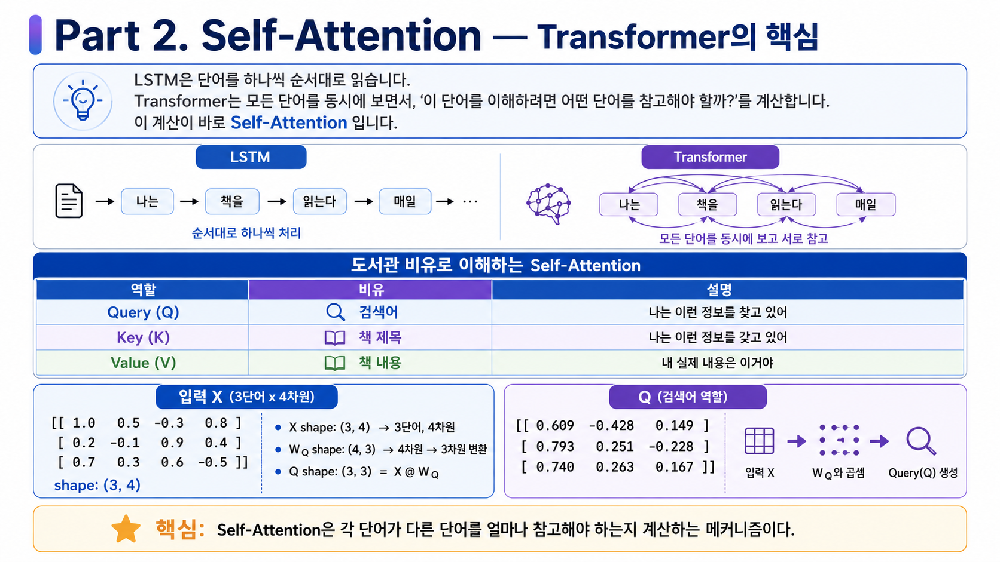

In [ ]:
# ──────────────────────────────────────────
# Self-Attention을 직접 계산해봅시다
# 문장: "영화가 정말 재미있다"
# ──────────────────────────────────────────
import numpy as np
np.random.seed(42)

# [준비] 각 단어를 4차원 벡터로 표현 (= 임베딩)
words = ["영화가", "정말", "재미있다"]
X = np.array([
    [1.0, 0.5, -0.3, 0.8],   # "영화가"의 임베딩
    [0.2, -0.1, 0.9, 0.4],   # "정말"의 임베딩
    [0.7, 0.3, 0.6, -0.5],   # "재미있다"의 임베딩
])
print("입력 X (3단어 x 4차원):")
print(X)
print(f"shape: {X.shape}")

입력 X (3단어 x 4차원):
[[ 1.   0.5 -0.3  0.8]
 [ 0.2 -0.1  0.9  0.4]
 [ 0.7  0.3  0.6 -0.5]]
shape: (3, 4)


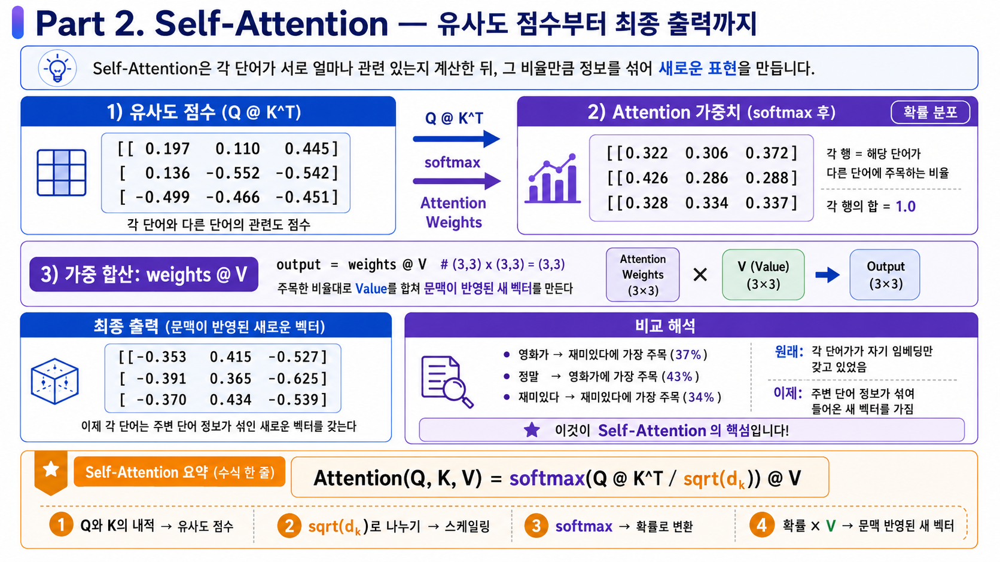

In [ ]:
# ──────────────────────────────────────────
# Step 1: Q, K, V 만들기
# 같은 단어인데 역할에 따라 다르게 변환합니다
# ──────────────────────────────────────────

d_k = 3  # Q, K, V의 차원

# 가중치 행렬 (실제로는 학습되는 값, 여기선 랜덤)
W_Q = np.random.randn(4, d_k) * 0.5  # 4차원 → 3차원으로 변환
W_K = np.random.randn(4, d_k) * 0.5
W_V = np.random.randn(4, d_k) * 0.5

# 행렬 곱으로 Q, K, V 생성
Q = X @ W_Q   # (3,4) x (4,3) = (3,3)
K = X @ W_K
V = X @ W_V

print(f"X shape:  {X.shape}  (3단어, 4차원)")
print(f"W_Q shape: {W_Q.shape}  (4차원 → 3차원 변환)")
print(f"Q shape:  {Q.shape}  (3단어, 3차원) = X @ W_Q")
print()
print("Q (검색어 역할):")
print(Q.round(3))

X shape:  (3, 4)  (3단어, 4차원)
W_Q shape: (4, 3)  (4차원 → 3차원 변환)
Q shape:  (3, 3)  (3단어, 3차원) = X @ W_Q

Q (검색어 역할):
[[ 0.609 -0.428  0.149]
 [ 0.793  0.251 -0.228]
 [ 0.74   0.263  0.167]]


In [ ]:
# ──────────────────────────────────────────
# Step 2: 유사도 계산 → 확률로 변환
# "각 단어가 다른 단어와 얼마나 관련 있는지" 점수 매기기
# ──────────────────────────────────────────

# 2-1) Q와 K의 내적 = 유사도 점수
scores = Q @ K.T          # (3,3) x (3,3)^T = (3,3)
print("유사도 점수 (Q @ K^T):")
print(scores.round(3))

# 2-2) 스케일링: 값이 너무 커지면 softmax가 극단적이 되므로
scores = scores / np.sqrt(d_k)

# 2-3) Softmax: 각 행의 합이 1인 확률로 변환
def softmax(x):
    e = np.exp(x - x.max(axis=-1, keepdims=True))  # 오버플로 방지
    return e / e.sum(axis=-1, keepdims=True)

weights = softmax(scores)  # 이것이 "Attention 가중치"

print("\nAttention 가중치 (softmax 후):")
print("  각 행 = 해당 단어가 다른 단어에 주목하는 비율")
print("  각 행의 합 = 1.0")
print(weights.round(3))

유사도 점수 (Q @ K^T):
[[ 0.197  0.11   0.445]
 [ 0.136 -0.552 -0.542]
 [-0.499 -0.466 -0.451]]

Attention 가중치 (softmax 후):
  각 행 = 해당 단어가 다른 단어에 주목하는 비율
  각 행의 합 = 1.0
[[0.322 0.306 0.372]
 [0.426 0.286 0.288]
 [0.328 0.334 0.337]]


In [ ]:
# ──────────────────────────────────────────
# Step 3: 가중 합산
# 주목한 비율대로 Value를 합쳐서 "문맥 반영된 새 벡터" 만들기
# ──────────────────────────────────────────

output = weights @ V   # (3,3) x (3,3) = (3,3)

print("최종 출력 (문맥이 반영된 새로운 벡터):")
print(output.round(3))
print()
print("비교:")
for i, w in enumerate(words):
    top = words[np.argmax(weights[i])]
    print(f" {w} → {top}에 가장 주목 ({weights[i].max():.0%})")

print()
print("원래: 각 단어가 자기 임베딩만 갖고 있었음")
print("이제: 주변 단어 정보가 섞여 들어온 새 벡터를 가짐")
print("이것이 Self-Attention의 핵심입니다!")

최종 출력 (문맥이 반영된 새로운 벡터):
[[-0.353  0.415 -0.527]
 [-0.391  0.365 -0.625]
 [-0.37   0.434 -0.539]]

비교:
 영화가 → 재미있다에 가장 주목 (37%)
 정말 → 영화가에 가장 주목 (43%)
 재미있다 → 재미있다에 가장 주목 (34%)

원래: 각 단어가 자기 임베딩만 갖고 있었음
이제: 주변 단어 정보가 섞여 들어온 새 벡터를 가짐
이것이 Self-Attention의 핵심입니다!


### Self-Attention 요약 (수식 한 줄)

```
Attention(Q, K, V) = softmax(Q @ K^T / sqrt(d_k)) @ V
```

1. Q와 K의 내적 → 유사도 점수  
2. sqrt(d_k)로 나누기 → 스케일링  
3. softmax → 확률로 변환  
4. 확률 × V → 문맥 반영된 새 벡터

---
## Part 3. Transformer 감성 분류 모델 만들기

6주차에서 만든 LSTM 모델과 **같은 데이터, 같은 학습 방법**을 씁니다.  
달라지는 건 모델 내부뿐입니다.

```
6주차 LSTM:        Embedding → LSTM         → Linear → Sigmoid
7주차 Transformer: Embedding → ★위치정보★ → ★Encoder★ → ★평균★ → Linear → Sigmoid
```

### 3-1. 데이터 준비 (6주차와 동일)

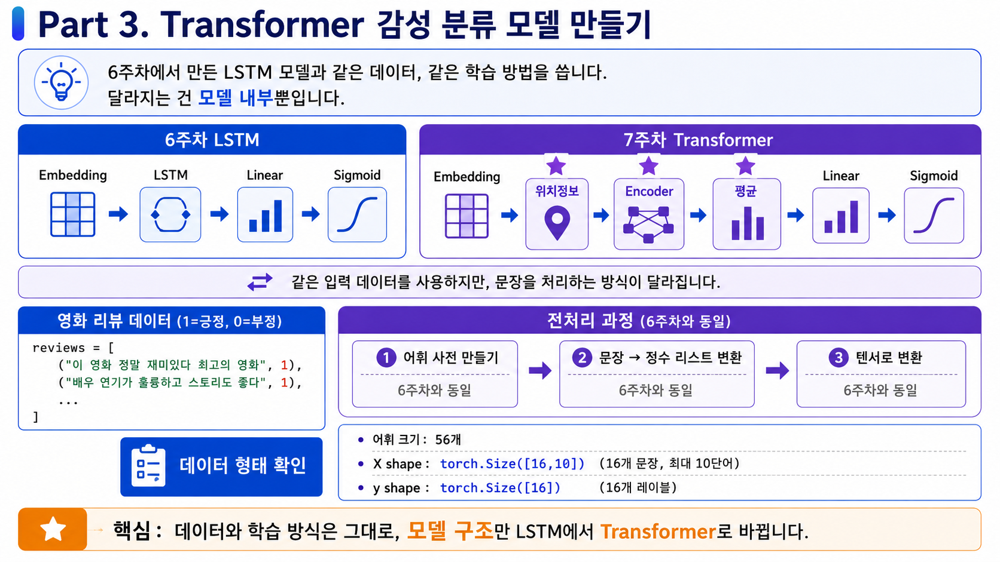

In [ ]:
# ──────────────────────────────────────────
# 데이터 준비 (6주차 코드와 거의 동일합니다)
# ──────────────────────────────────────────
import torch
import torch.nn as nn

# 영화 리뷰 데이터 (1=긍정, 0=부정)
reviews = [
    ("이 영화 정말 재미있다 최고의 영화", 1),
    ("배우 연기가 훌륭하고 스토리도 좋다", 1),
    ("감동적인 영화 눈물이 났다", 1),
    ("올해 최고의 영화 강추한다", 1),
    ("재미있고 감동적이다 또 보고 싶다", 1),
    ("연출이 뛰어나고 음악도 좋다", 1),
    ("완벽한 영화 모든 것이 좋았다", 1),
    ("시간 가는 줄 모르고 봤다 재미있다", 1),
    ("이 영화 정말 지루하다 별로다", 0),
    ("스토리가 너무 진부하고 재미없다", 0),
    ("시간 낭비 돈 아깝다", 0),
    ("연기가 어색하고 내용이 별로다", 0),
    ("최악의 영화 다시는 안 본다", 0),
    ("지루하고 졸렸다 비추천한다", 0),
    ("기대했는데 실망이다 별로다", 0),
    ("돈이 아깝다 최악이다", 0),
]

# 어휘 사전 만들기 (6주차와 동일)
all_words = [w for text, _ in reviews for w in text.split()]
vocab = sorted(set(all_words))
word2idx = {w: i+2 for i, w in enumerate(vocab)}
word2idx["<PAD>"] = 0    # 패딩 토큰
word2idx["<UNK>"] = 1    # 모르는 단어

# 문장 → 정수 리스트 변환 (6주차와 동일)
MAX_LEN = 10

def encode(text):
    ids = [word2idx.get(w, 1) for w in text.split()]  # 단어 → 정수
    ids = ids[:MAX_LEN]                                # 너무 길면 자르기
    ids = ids + [0] * (MAX_LEN - len(ids))             # 짧으면 0으로 채우기
    return ids

# 텐서로 변환 (6주차와 동일)
X = torch.tensor([encode(t) for t, _ in reviews], dtype=torch.long)
y = torch.tensor([label for _, label in reviews], dtype=torch.float32)

VOCAB_SIZE = len(word2idx)
print(f"어휘 크기: {VOCAB_SIZE}개")
print(f"X shape: {X.shape}  (16개 문장, 최대 {MAX_LEN}단어)")
print(f"y shape: {y.shape}  (16개 레이블)")

어휘 크기: 56개
X shape: torch.Size([16, 10])  (16개 문장, 최대 10단어)
y shape: torch.Size([16])  (16개 레이블)


### 3-2. 모델 정의

6주차 LSTM 모델과 나란히 비교하면서 봅시다.

In [ ]:
# ──────────────────────────────────────────
# [비교] 6주차 LSTM 모델 (복습용)
# ──────────────────────────────────────────

class SentimentLSTM(nn.Module):
    def __init__(self, vocab_size, d_model):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, d_model, padding_idx=0)
        self.lstm = nn.LSTM(d_model, d_model, batch_first=True)  # ← LSTM
        self.fc = nn.Linear(d_model, 1)

    def forward(self, x):
        x = self.embedding(x)           # 정수 → 벡터
        _, (h, _) = self.lstm(x)         # LSTM → 마지막 은닉 상태
        x = torch.sigmoid(self.fc(h.squeeze(0)))  # 분류
        return x.squeeze(1)

print("6주차 LSTM 모델 (복습용)")
print("  Embedding → LSTM → Linear → Sigmoid")

6주차 LSTM 모델 (복습용)
  Embedding → LSTM → Linear → Sigmoid


In [ ]:
# ──────────────────────────────────────────
# [새로운 부품] Positional Encoding
#
# LSTM은 단어를 순서대로 읽으니까 위치를 자동으로 알지만,
# Transformer는 모든 단어를 동시에 보니까 위치를 모릅니다.
# 그래서 "몇 번째 단어인지" 정보를 임베딩에 더해줍니다.
# ──────────────────────────────────────────
import math

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=200):
        super().__init__()
        pe = torch.zeros(max_len, d_model)            # 위치별 벡터 틀
        pos = torch.arange(max_len).float().unsqueeze(1)  # 0, 1, 2, ...
        div = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000) / d_model))
        pe[:, 0::2] = torch.sin(pos * div)            # 짝수 차원: sin
        pe[:, 1::2] = torch.cos(pos * div)            # 홀수 차원: cos
        self.register_buffer("pe", pe.unsqueeze(0))    # 학습 안 되는 고정값

    def forward(self, x):
        # x: (배치, 문장길이, 차원)
        return x + self.pe[:, :x.size(1)]  # 임베딩에 위치 정보를 더함

print("PositionalEncoding 정의 완료")
print("  역할: 각 위치(1번째, 2번째, ...)에 고유한 패턴을 더해줌")

PositionalEncoding 정의 완료
  역할: 각 위치(1번째, 2번째, ...)에 고유한 패턴을 더해줌




> Add blockquote

> Add blockquote



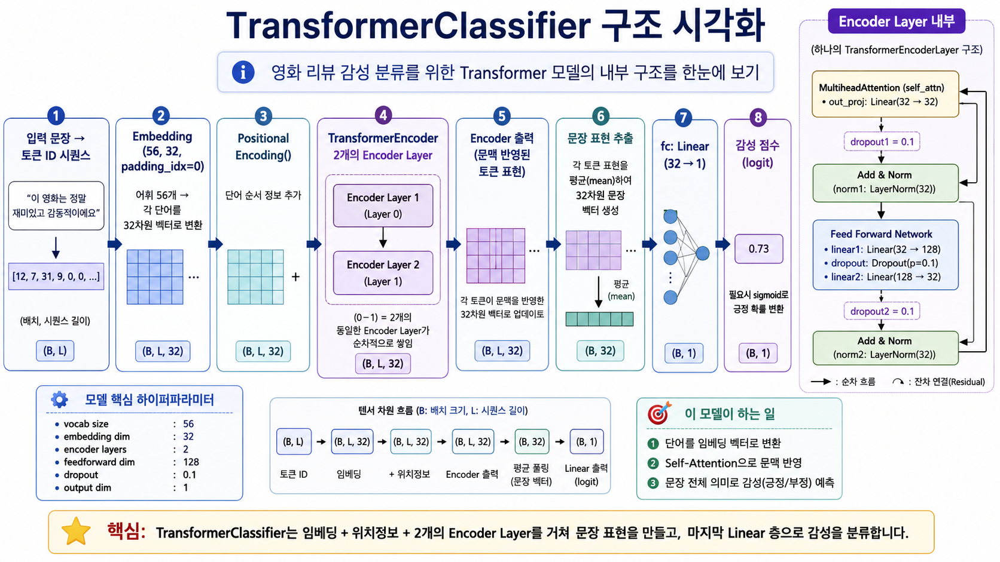

In [ ]:
# ──────────────────────────────────────────
# [새로운 모델] Transformer 감성 분류
#
# LSTM 모델과 비교하면서 읽어보세요.
# 구조: Embedding → 위치정보 → Transformer → 평균 → 분류
# ──────────────────────────────────────────

class TransformerClassifier(nn.Module):
    def __init__(self, vocab_size, d_model, num_heads, num_layers):
        super().__init__()

        # (1) 임베딩: 정수 → 벡터 (LSTM과 동일)
        self.embedding = nn.Embedding(vocab_size, d_model, padding_idx=0)

        # (2) 위치 인코딩: 순서 정보 추가 (LSTM에는 없던 것)
        self.pos_enc = PositionalEncoding(d_model)

        # (3) Transformer 인코더: Self-Attention이 여기서 일어남
        #     - d_model: 벡터 차원
        #     - nhead: 동시에 보는 "관점"의 수
        #     - dim_feedforward: 내부 변환 크기 (관례: d_model x 4)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=num_heads,
            dim_feedforward=d_model * 4,
            dropout=0.1,
            batch_first=True
        )
        # encoder_layer를 num_layers번 반복 쌓기
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # (4) 분류: 벡터 → 긍정 확률 (LSTM과 동일)
        self.fc = nn.Linear(d_model, 1)

    def forward(self, x):
        # x shape: (배치, 문장길이) ← 정수 시퀀스

        mask = (x == 0)                      # PAD 위치 마스킹 (무시하도록)

        x = self.embedding(x)                # (배치, 문장길이, d_model)
        x = self.pos_enc(x)                  # 위치 정보 추가

        x = self.encoder(x, src_key_padding_mask=mask)  # Self-Attention!

        # LSTM과의 차이점:
        # LSTM은 "마지막 은닉 상태 h_n"을 문장 벡터로 사용
        # Transformer는 "모든 위치 출력의 평균"을 문장 벡터로 사용
        x = x.mean(dim=1)                    # (배치, d_model)

        x = torch.sigmoid(self.fc(x))        # (배치, 1) → 확률
        return x.squeeze(1)                  # (배치,)


# 모델 생성
D_MODEL = 32     # 임베딩 차원 (6주차와 동일)
NUM_HEADS = 4    # Attention 관점 수 (d_model의 약수여야 함)
NUM_LAYERS = 2   # 인코더 블록 반복 수

model = TransformerClassifier(VOCAB_SIZE, D_MODEL, NUM_HEADS, NUM_LAYERS)
print(model)

TransformerClassifier(
  (embedding): Embedding(56, 32, padding_idx=0)
  (pos_enc): PositionalEncoding()
  (encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-1): 2 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=32, out_features=32, bias=True)
        )
        (linear1): Linear(in_features=32, out_features=128, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=128, out_features=32, bias=True)
        (norm1): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=32, out_features=1, bias=True)
)


---
## Part 4. 데이터가 모델을 통과하는 과정

하나의 문장을 넣고, 각 단계에서 **shape이 어떻게 바뀌는지** 확인합니다.  
6주차에서 LSTM의 입출력 shape을 확인했던 것과 같은 방식입니다.

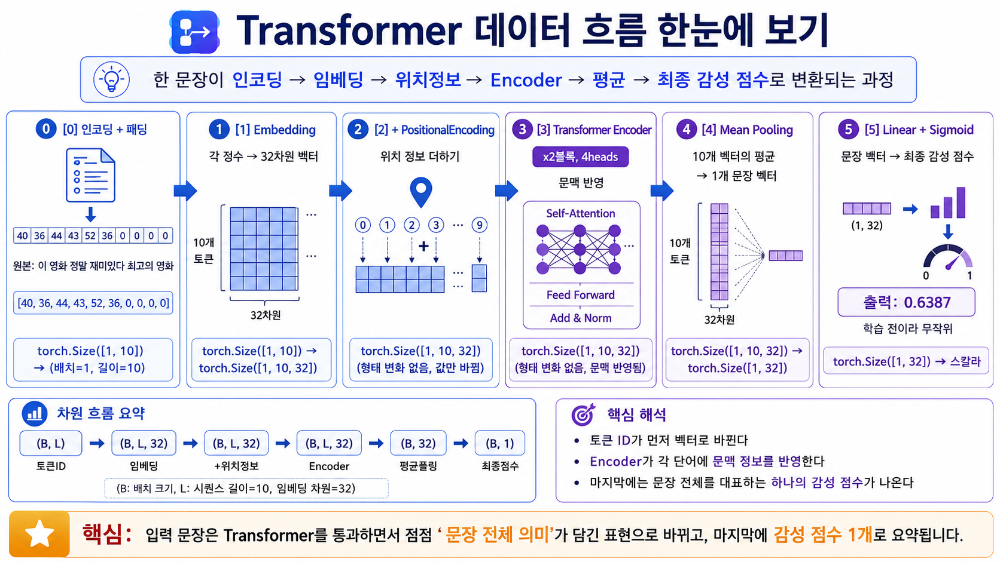

In [ ]:
# ──────────────────────────────────────────
# 문장 하나를 모델에 넣어보며 각 단계를 추적
# ──────────────────────────────────────────
sample = "이 영화 정말 재미있다 최고의 영화"
print(f"원본: {sample}\n")

# (0) 정수 인코딩 + 패딩
ids = encode(sample)
inp = torch.tensor([ids], dtype=torch.long)     # 배치 차원 추가
print(f"[0] 인코딩+패딩: {ids}")
print(f"    shape: {inp.shape}  → (배치=1, 길이={MAX_LEN})\n")

# 이하 모델 내부를 단계별로 실행
model.eval()
with torch.no_grad():

    # (1) Embedding
    emb = model.embedding(inp)
    print(f"[1] Embedding: 각 정수 → {D_MODEL}차원 벡터")
    print(f"    shape: {inp.shape} → {emb.shape}\n")

    # (2) Positional Encoding
    pos = model.pos_enc(emb)
    print(f"[2] + PositionalEncoding: 위치 정보 더하기")
    print(f"    shape: {pos.shape}  (형태 변화 없음, 값만 바뀜)\n")

    # (3) Transformer Encoder
    mask = (inp == 0)
    enc = model.encoder(pos, src_key_padding_mask=mask)
    print(f"[3] Transformer Encoder (x{NUM_LAYERS}블록, {NUM_HEADS}heads)")
    print(f"    shape: {enc.shape}  (형태 변화 없음, 문맥 반영됨)\n")

    # (4) Mean Pooling
    pooled = enc.mean(dim=1)
    print(f"[4] Mean Pooling: {MAX_LEN}개 벡터의 평균 → 1개 문장 벡터")
    print(f"    shape: {enc.shape} → {pooled.shape}\n")

    # (5) Linear + Sigmoid
    prob = torch.sigmoid(model.fc(pooled)).item()
    print(f"[5] Linear + Sigmoid")
    print(f"    shape: {pooled.shape} → 스칼라")
    print(f"    출력: {prob:.4f}  (학습 전이라 무작위)")

원본: 이 영화 정말 재미있다 최고의 영화

[0] 인코딩+패딩: [40, 36, 44, 43, 52, 36, 0, 0, 0, 0]
    shape: torch.Size([1, 10])  → (배치=1, 길이=10)

[1] Embedding: 각 정수 → 32차원 벡터
    shape: torch.Size([1, 10]) → torch.Size([1, 10, 32])

[2] + PositionalEncoding: 위치 정보 더하기
    shape: torch.Size([1, 10, 32])  (형태 변화 없음, 값만 바뀜)

[3] Transformer Encoder (x2블록, 4heads)
    shape: torch.Size([1, 10, 32])  (형태 변화 없음, 문맥 반영됨)

[4] Mean Pooling: 10개 벡터의 평균 → 1개 문장 벡터
    shape: torch.Size([1, 10, 32]) → torch.Size([1, 32])

[5] Linear + Sigmoid
    shape: torch.Size([1, 32]) → 스칼라
    출력: 0.6603  (학습 전이라 무작위)


In [ ]:
# ──────────────────────────────────────────
# 한눈에 보는 요약
# ──────────────────────────────────────────
print("""
=== Transformer 데이터 흐름 ===

"이 영화 정말 재미있다 최고의 영화"
  |  인코딩 + 패딩
  v
(1, 10)              정수 시퀀스
  |  Embedding
  v
(1, 10, 32)          각 정수 -> 32차원 벡터
  |  + Positional Encoding
  v
(1, 10, 32)          위치 정보 추가
  |  Transformer Encoder x2
  |    (내부에서 Self-Attention이 일어남)
  v
(1, 10, 32)          문맥이 반영된 벡터
  |  Mean Pooling (평균)
  v
(1, 32)              문장 벡터 1개
  |  Linear + Sigmoid
  v
0.xxxx               긍정 확률
""")


=== Transformer 데이터 흐름 ===

"이 영화 정말 재미있다 최고의 영화"
  |  인코딩 + 패딩
  v
(1, 10)              정수 시퀀스
  |  Embedding
  v
(1, 10, 32)          각 정수 -> 32차원 벡터
  |  + Positional Encoding
  v
(1, 10, 32)          위치 정보 추가
  |  Transformer Encoder x2
  |    (내부에서 Self-Attention이 일어남)
  v
(1, 10, 32)          문맥이 반영된 벡터
  |  Mean Pooling (평균)
  v
(1, 32)              문장 벡터 1개
  |  Linear + Sigmoid
  v
0.xxxx               긍정 확률



---
## Part 5. 학습하기 & LSTM과 비교

학습 루프는 6주차와 **완전히 동일**합니다.  
모델만 바꿨을 뿐, 나머지 코드는 그대로입니다.

In [ ]:
# ──────────────────────────────────────────
# Transformer 학습 (6주차 학습 루프와 동일한 패턴!)
# ──────────────────────────────────────────

# 모델 새로 생성
model = TransformerClassifier(VOCAB_SIZE, D_MODEL, NUM_HEADS, NUM_LAYERS)

# 손실 함수 & 옵티마이저 (6주차와 동일)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 학습 루프 (6주차와 동일한 5줄 패턴)
tf_losses = []
EPOCHS = 150

for epoch in range(EPOCHS):
    model.train()
    pred = model(X)                       # 1. 순전파
    loss = criterion(pred, y)             # 2. 손실 계산
    optimizer.zero_grad()                 # 3. 기울기 초기화
    loss.backward()                       # 4. 역전파
    optimizer.step()                      # 5. 가중치 업데이트

    tf_losses.append(loss.item())

    if (epoch + 1) % 30 == 0:
        acc = ((pred >= 0.5).float() == y).float().mean()
        print(f"Epoch {epoch+1:3d} | Loss: {loss.item():.4f} | Acc: {acc.item():.0%}")

print("\n학습 완료!")

Epoch  30 | Loss: 0.0437 | Acc: 100%
Epoch  60 | Loss: 0.0128 | Acc: 100%
Epoch  90 | Loss: 0.0082 | Acc: 100%
Epoch 120 | Loss: 0.0059 | Acc: 100%
Epoch 150 | Loss: 0.0044 | Acc: 100%

학습 완료!


In [ ]:
# ──────────────────────────────────────────
# LSTM도 같은 데이터로 학습 (비교용)
# ──────────────────────────────────────────

lstm_model = SentimentLSTM(VOCAB_SIZE, D_MODEL)
lstm_opt = torch.optim.Adam(lstm_model.parameters(), lr=0.01)
lstm_losses = []

for epoch in range(EPOCHS):
    lstm_model.train()
    pred = lstm_model(X)
    loss = criterion(pred, y)
    lstm_opt.zero_grad()
    loss.backward()
    lstm_opt.step()
    lstm_losses.append(loss.item())

# 파라미터 수 비교
tf_params = sum(p.numel() for p in model.parameters())
lstm_params = sum(p.numel() for p in lstm_model.parameters())
print(f"LSTM 파라미터:        {lstm_params:,}개")
print(f"Transformer 파라미터: {tf_params:,}개")
print(f"\nTransformer가 약 {tf_params/lstm_params:.1f}배 더 많은 파라미터를 가짐")

LSTM 파라미터:        10,273개
Transformer 파라미터: 27,233개

Transformer가 약 2.7배 더 많은 파라미터를 가짐


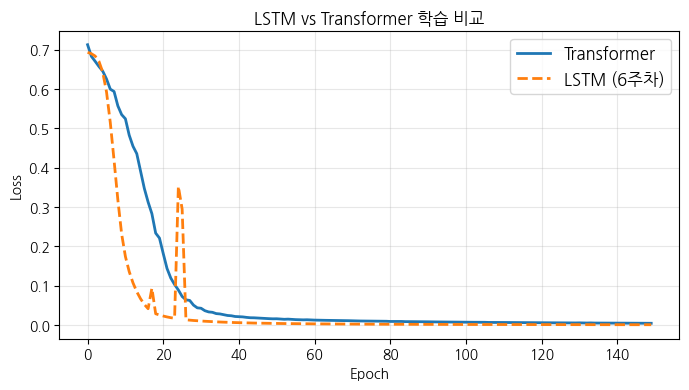

In [ ]:
# ──────────────────────────────────────────
# 학습 곡선 비교
# ──────────────────────────────────────────
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
plt.plot(tf_losses, label="Transformer", linewidth=2)
plt.plot(lstm_losses, label="LSTM (6주차)", linewidth=2, linestyle="--")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("LSTM vs Transformer 학습 비교")
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
# ──────────────────────────────────────────
# 새 문장으로 예측 테스트
# ──────────────────────────────────────────

def predict(text):
    """문장을 넣으면 긍정/부정을 예측합니다"""
    model.eval()
    inp = torch.tensor([encode(text)], dtype=torch.long)
    with torch.no_grad():
        prob = model(inp).item()
    label = "긍정" if prob >= 0.5 else "부정"
    print(f"  {text}  →  {label} ({prob:.0%})")


print("=== 예측 결과 ===")
predict("정말 재미있다 최고의 영화")
predict("지루하고 별로다 실망이다")
predict("연기가 좋고 감동적이다")
predict("시간 낭비 최악이다")

=== 예측 결과 ===
  정말 재미있다 최고의 영화  →  긍정 (90%)
  지루하고 별로다 실망이다  →  부정 (16%)
  연기가 좋고 감동적이다  →  긍정 (67%)
  시간 낭비 최악이다  →  부정 (16%)


---
## Part 6. Attention을 눈으로 확인하기

학습된 모델이 실제로 어떤 단어에 주목하는지 히트맵으로 봅니다.

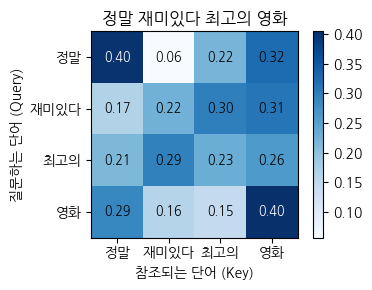

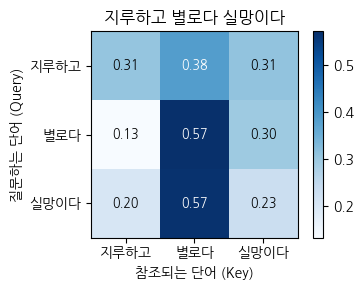

In [ ]:
# ──────────────────────────────────────────
# Attention 가중치를 꺼내서 히트맵으로 시각화
# ──────────────────────────────────────────
import matplotlib.pyplot as plt

def show_attention(text):
    """문장의 Attention 가중치를 히트맵으로 보여줍니다"""
    model.eval()
    inp = torch.tensor([encode(text)], dtype=torch.long)
    tokens = text.split()
    n = len(tokens)  # 실제 단어 수 (PAD 제외)

    # 모델 내부에서 Attention 가중치 추출
    with torch.no_grad():
        emb = model.pos_enc(model.embedding(inp))   # 임베딩 + 위치
        first_layer = model.encoder.layers[0]        # 첫 번째 레이어
        _, attn_weights = first_layer.self_attn(     # Attention 실행
            emb, emb, emb,
            key_padding_mask=(inp == 0)
        )

    # 히트맵 그리기 (PAD 부분은 제외하고 실제 단어만)
    w = attn_weights[0, :n, :n].numpy()

    plt.figure(figsize=(max(4, n), max(3, n * 0.7)))
    plt.imshow(w, cmap="Blues")
    plt.xticks(range(n), tokens)
    plt.yticks(range(n), tokens)
    plt.xlabel("참조되는 단어 (Key)")
    plt.ylabel("질문하는 단어 (Query)")
    plt.title(f"{text}")

    # 각 칸에 숫자 표시
    for i in range(n):
        for j in range(n):
            color = "white" if w[i,j] > 0.35 else "black"
            plt.text(j, i, f"{w[i,j]:.2f}",
                     ha="center", va="center", fontsize=9, color=color)

    plt.colorbar(fraction=0.046)
    plt.tight_layout()
    plt.show()


# 긍정 문장
show_attention("정말 재미있다 최고의 영화")

# 부정 문장
show_attention("지루하고 별로다 실망이다")

---
## Part 7. 학생 실습 ✏️

### 실습 1: Self-Attention 직접 계산

In [ ]:
# ✏️ 실습 1: "배우가 연기를 잘한다"로 Self-Attention을 계산하세요
#
# [순서]
# 1. W_Q, W_K, W_V를 만드세요 (np.random.randn(4, 3) * 0.5)
# 2. Q = X_ex @ W_Q,  K = X_ex @ W_K,  V = X_ex @ W_V
# 3. scores = Q @ K.T / np.sqrt(3)
# 4. weights = softmax(scores)
# 5. output = weights @ V
# 6. "잘한다"가 어디에 가장 주목하는지 확인하세요

import numpy as np

words_ex = ["배우가", "연기를", "잘한다"]
X_ex = np.array([
    [0.8, 0.2, -0.5, 0.3],   # 배우가
    [0.1, 0.9, 0.4, -0.2],   # 연기를
    [0.6, -0.3, 0.7, 0.5],   # 잘한다
])

# 여기에 코드를 작성하세요



In [ ]:
# ✅ 실습 1 정답
np.random.seed(7)

W_Q = np.random.randn(4, 3) * 0.5
W_K = np.random.randn(4, 3) * 0.5
W_V = np.random.randn(4, 3) * 0.5

Q = X_ex @ W_Q
K = X_ex @ W_K
V = X_ex @ W_V

scores = Q @ K.T / np.sqrt(3)
weights = softmax(scores)
output = weights @ V

print("Attention 가중치:")
print(weights.round(3))
print()
for i, w in enumerate(words_ex):
    top = words_ex[np.argmax(weights[i])]
    print(f"  {w} → {top}에 주목 ({weights[i].max():.0%})")

Attention 가중치:
[[0.37  0.261 0.369]
 [0.252 0.277 0.471]
 [0.227 0.227 0.546]]

  배우가 → 배우가에 주목 (37%)
  연기를 → 잘한다에 주목 (47%)
  잘한다 → 잘한다에 주목 (55%)


### 실습 2: 하이퍼파라미터 바꿔보기

In [ ]:
# ✏️ 실습 2: d_model, num_heads, num_layers를 바꿔가며
#           학습 결과를 비교하세요.
#
# 주의: d_model은 num_heads로 나누어 떨어져야 합니다.
#       예) d_model=16, num_heads=2 → OK (16/2=8)
#       예) d_model=16, num_heads=3 → ERROR (16/3=5.3)

configs = [
    (16, 2, 1, "Small"),     # 작은 모델
    (32, 4, 2, "Medium"),    # 중간 모델 (현재 설정)
    (64, 8, 4, "Large"),     # 큰 모델
]

# 여기에 코드를 작성하세요
# 힌트: 각 설정으로 모델 만들기 → 150 에포크 학습 → loss 기록 → 그래프 비교


  Small (d=16, h=2, L=1) | 파라미터: 4,193개 | 최종 Loss: 0.0223
 Medium (d=32, h=4, L=2) | 파라미터: 27,233개 | 최종 Loss: 0.0047
  Large (d=64, h=8, L=4) | 파라미터: 203,585개 | 최종 Loss: 0.0014


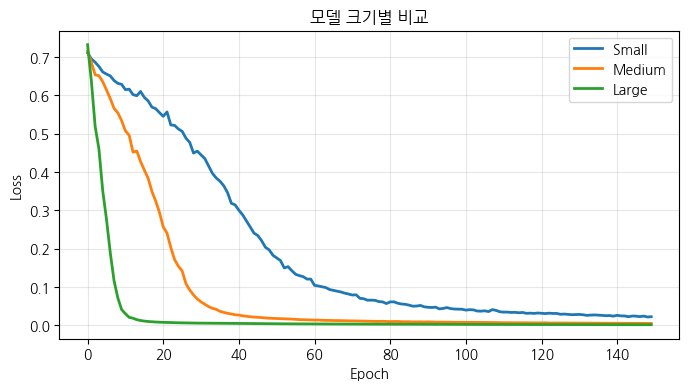

In [ ]:
# ✅ 실습 2 정답
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))

for d, h, l, name in configs:
    m = TransformerClassifier(VOCAB_SIZE, d, h, l)
    opt = torch.optim.Adam(m.parameters(), lr=0.001)
    losses = []

    for ep in range(150):
        m.train()
        p = m(X)
        lo = criterion(p, y)
        opt.zero_grad()
        lo.backward()
        opt.step()
        losses.append(lo.item())

    params = sum(pp.numel() for pp in m.parameters())
    print(f"{name:>7} (d={d}, h={h}, L={l}) | 파라미터: {params:,}개 | 최종 Loss: {losses[-1]:.4f}")
    plt.plot(losses, label=name, linewidth=2)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("모델 크기별 비교")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

---
## 핵심 정리

### LSTM vs Transformer — 코드로 본 차이

```python
# 6주차 LSTM
x = self.embedding(x)        # 동일
_, (h, _) = self.lstm(x)     # LSTM: 순서대로 읽기
x = self.fc(h.squeeze(0))    # 마지막 은닉 상태로 분류

# 7주차 Transformer
x = self.embedding(x)        # 동일
x = self.pos_enc(x)          # ★ 위치 정보 추가 (새로운 부분)
x = self.encoder(x)          # ★ Self-Attention (새로운 부분)
x = x.mean(dim=1)            # ★ 평균으로 문장 벡터 (새로운 부분)
x = self.fc(x)               # 분류
```

### Self-Attention 수식

```
Attention(Q, K, V) = softmax(Q @ K^T / sqrt(d_k)) @ V
```

### 다음 시간 (8주차: GPT)

```
7주차: Transformer Encoder → 분류 (양방향으로 모든 단어를 봄)
8주차: Transformer Decoder → 생성 (왼쪽만 보고 다음 단어를 예측)
```